# Overall Plan

1. Take in any input audio file (convert to wav format using pydub library) and turn into spectrograms.
2. Get genre predictions on the generated spectrograms, and average the results (each song is split into multiple pieces, and a spectrogram is generated for each. The genre prediction is then run on each spectrogram).
3. With the genre prediction, output identifying information about another song in the same genre.

# Generate Spectrograms

In [ ]:
!pip install youtube_dl
!pip install pydub
!wget https://raw.githubusercontent.com/tbertinmahieux/MSongsDB/master/PythonSrc/hdf5_getters.py
!pip install tables # need PyTables package to use hdf5_getters

--2021-05-13 01:20:22--  https://raw.githubusercontent.com/tbertinmahieux/MSongsDB/master/PythonSrc/hdf5_getters.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 21702 (21K) [text/plain]
Saving to: ‘hdf5_getters.py.2’

hdf5_getters.py.2   100%[===================>]  21.19K  --.-KB/s    in 0.002s  

2021-05-13 01:20:22 (12.0 MB/s) - ‘hdf5_getters.py.2’ saved [21702/21702]



In [ ]:
# imports
import librosa
import librosa.display
import IPython.display as ipd
import wave # to find the duration of a song
import youtube_dl
from pydub import AudioSegment
import numpy as np
import matplotlib.pyplot as plt
import torch, torchvision
import os
import statistics
import random
import tables
import hdf5_getters

from torch import nn, optim
from torchvision import datasets, models, transforms
from google_drive_downloader import GoogleDriveDownloader as gdd
from torch.autograd import Variable

In [ ]:
# getting a wav file to test with

# desired_filename = 'testsong.wav'
ydl_opts = {
    'format': 'bestaudio/best',
    # 'outtmpl' : desired_filename,
    'postprocessors': [{
        'key': 'FFmpegExtractAudio',
        'preferredcodec': 'wav',
        'preferredquality': '192',
    }]
}

with youtube_dl.YoutubeDL(ydl_opts) as ydl:
    ydl.download(['https://www.youtube.com/watch?v=dQw4w9WgXcQ'])
    info = ydl.extract_info('https://www.youtube.com/watch?v=dQw4w9WgXcQ', download=False)
    print("Music" in info['categories'])

[youtube] dQw4w9WgXcQ: Downloading webpage
[download] Destination: Rick Astley - Never Gonna Give You Up (Video)-dQw4w9WgXcQ.webm
[download] 100% of 3.28MiB in 00:00
[ffmpeg] Destination: Rick Astley - Never Gonna Give You Up (Video)-dQw4w9WgXcQ.wav
Deleting original file Rick Astley - Never Gonna Give You Up (Video)-dQw4w9WgXcQ.webm (pass -k to keep)
[youtube] dQw4w9WgXcQ: Downloading webpage
True


In [ ]:
info = ydl.extract_info('https://www.youtube.com/watch?v=dQw4w9WgXcQ', download=False)

[youtube] dQw4w9WgXcQ: Downloading webpage


In [ ]:
info

{'abr': 129.716,
 'acodec': 'opus',
 'age_limit': 0,
 'alt_title': 'Never Gonna Give You Up (7" Mix)',
 'artist': 'Rick Astley',
 'asr': 48000,
 'average_rating': 4.8865957,
 'categories': ['Music'],
 'channel': 'Official Rick Astley',
 'channel_id': 'UC38IQsAvIsxxjztdMZQtwHA',
 'channel_url': 'https://www.youtube.com/channel/UC38IQsAvIsxxjztdMZQtwHA',
 'container': 'webm_dash',
 'creator': 'Rick Astley',
 'description': "Rick Astley's official music video for “Never Gonna Give You Up” \nListen to Rick Astley: https://RickAstley.lnk.to/_listenYD\n\nSubscribe to the official Rick Astley YouTube channel: https://RickAstley.lnk.to/subscribeYD\n\nFollow Rick Astley:\nFacebook: https://RickAstley.lnk.to/followFI\nTwitter: https://RickAstley.lnk.to/followTI\nInstagram: https://RickAstley.lnk.to/followII\nWebsite: https://RickAstley.lnk.to/followWI\nSpotify: https://RickAstley.lnk.to/followSI\n\nLyrics:\nNever gonna give you up\nNever gonna let you down\nNever gonna run around and desert you\

In [ ]:
(("Music" in info['categories']) and 
(info["duration"] < 600))

True

In [ ]:
song_file = "Rick Astley - Never Gonna Give You Up (Video)-dQw4w9WgXcQ.wav"
song_file

'Rick Astley - Never Gonna Give You Up (Video)-dQw4w9WgXcQ.wav'

In [ ]:
# find the number of spectrograms that can be generated from an audio file
def num_spectrograms_possible(song_file):
  read = wave.open(song_file)
  framerate = read.getframerate() # get sample rate
  numframes = read.getnframes()   # get number of samples
  duration = numframes/framerate  # duration of song: frames/frames-per-second = seconds
  # print(duration)
  
  # compute the number of 90 second clips available in this file
  num_spectrograms = int(duration / 90)
  return num_spectrograms

In [ ]:
# ipd.Audio(song_file)

In [ ]:
# import soundfile as sf

# x, sr = librosa.load(song_file)
# sf.write(song_file, x, sr)
# wave.open(song_file, 'r')

In [ ]:
# Returns a 2-d array containing 90-second clips from a wav file in 3 chunks of 30 each.
# Each chunk corresponsd to one channel of a spectrogram to be fed into VGG-19 
def get_song_clips(song_file):
  audio = AudioSegment.from_wav(song_file)
  song_files = []
  for j in range(num_spectrograms_possible(song_file)):
    clips = []
    for i in range(3):
      t1 = (j*90*1000) + (i*30) * 1000 #Works in milliseconds
      t2 = (j*90*1000) + (i*30 + 30) * 1000
      newAudio = audio[t1:t2]
      newAudio.export(f'{j*90 + i*30}to{j*90 + i*30 + 30}-' + song_file, format="wav") #Exports to a wav file in the current path.
      clips.append(f'{j*90 + i*30}to{j*90 + i*30 + 30}-' + song_file)
    song_files.append(clips)
  return song_files

song_files = get_song_clips(song_file)

In [ ]:
for clips in song_files:
  for x in clips:
    print(x)

0to30-Rick Astley - Never Gonna Give You Up (Video)-dQw4w9WgXcQ.wav
30to60-Rick Astley - Never Gonna Give You Up (Video)-dQw4w9WgXcQ.wav
60to90-Rick Astley - Never Gonna Give You Up (Video)-dQw4w9WgXcQ.wav
90to120-Rick Astley - Never Gonna Give You Up (Video)-dQw4w9WgXcQ.wav
120to150-Rick Astley - Never Gonna Give You Up (Video)-dQw4w9WgXcQ.wav
150to180-Rick Astley - Never Gonna Give You Up (Video)-dQw4w9WgXcQ.wav


In [ ]:
print(song_files[0][0])
ipd.Audio(song_files[0][0])

0to30-Rick Astley - Never Gonna Give You Up (Video)-dQw4w9WgXcQ.wav


In [ ]:
# Loading audio files with Librosa

# Loads audio files from get_song_clips() into librosa.
# Returns a numpy array representing those clips. 
def librosa_load_song_clips(song_files):
  song_clips = []
  for clips in song_files:
    song_chunks = []
    for chunks in clips:
      song, sr = librosa.load(chunks)
      song_chunks.append(song)
      # print(sr)
    song_clips.append(song_chunks)
  return song_clips

song_clips = librosa_load_song_clips(song_files)

In [ ]:
print(len(song_clips))
for i in range(len(song_clips)):
  for j in range(len(song_clips[i])):
    print(len(song_clips[i][j]))
    print(type(song_clips[i][j]))

2
661500
<class 'numpy.ndarray'>
661500
<class 'numpy.ndarray'>
661500
<class 'numpy.ndarray'>
661500
<class 'numpy.ndarray'>
661500
<class 'numpy.ndarray'>
661500
<class 'numpy.ndarray'>


In [ ]:
# Takes 2-d array of numpy arrays representing 90-second song clips, each split into 3 separate numpy arrays, 
# all loaded into librosa. Returns the element-wise stft (short time fourier transform) 
# of the input array.
def get_stft_of_clips(song_clips):
  # extracting short-time fourier transform
  FRAME_SIZE = 446 # frame size chosen such that frequency_bins = frame_size/2 - 1 = 224
  HOP_SIZE = 2965  # Hop size chosen such that num_frames = (samples - frame_size)/ hop_size + 1 = 224 
                   # Output shape of the stft is (frequency_bins, num_frames). Desired: (224, 224)
  stft = []
  for i in range(len(song_clips)):
    channels = []
    for j in range(len(song_clips[i])):
      channels.append(librosa.stft(song_clips[i][j], n_fft=FRAME_SIZE, hop_length=HOP_SIZE))
    stft.append(channels)
  return stft

stft = get_stft_of_clips(song_clips)

In [ ]:
# checking the shape of the stft outputs
print((stft[0][0].shape, stft[0][1].shape, stft[0][2].shape))
print((stft[0][0].shape, stft[0][1].shape, stft[0][2].shape))

((224, 224), (224, 224), (224, 224))
((224, 224), (224, 224), (224, 224))


In [ ]:
type(stft[0][0][0][0])

numpy.complex64

In [ ]:
# Calculates and returns the spectrograms of each element in the input numpy array.
# The input numpy array must be the output of get_stft_of_clips().
def calculate_spectrograms(stft):
  specs = []
  for i in range(len(stft)):
    channels = []
    for j in range(len(stft[i])):
      channels.append(np.abs(stft[i][j]) ** 2)
    specs.append(channels)
  return specs

specs = calculate_spectrograms(stft)

In [ ]:
specs[0][0].shape

(224, 224)

In [ ]:
type(specs[0][0][0][0])

numpy.float32

In [ ]:
# Visualizing the spectrogram
def plot_spectrogram(Y, sr, hop_length, y_axis="linear"):
  fig = plt.figure(figsize=(25,10))
  # plt.axis('off')
  librosa.display.specshow(
      Y,
      sr=sr,
      hop_length=hop_length,
      x_axis="time",
      y_axis=y_axis
  )
  plt.colorbar(format="%+2.f")
  return fig

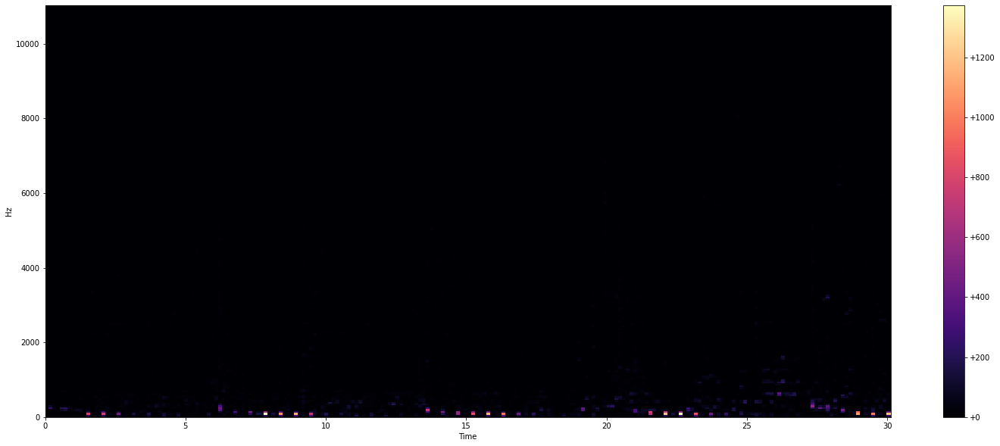

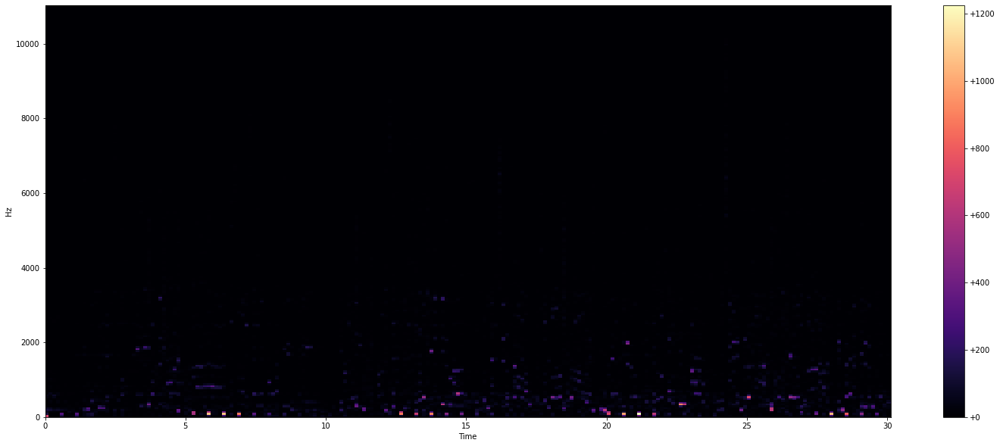

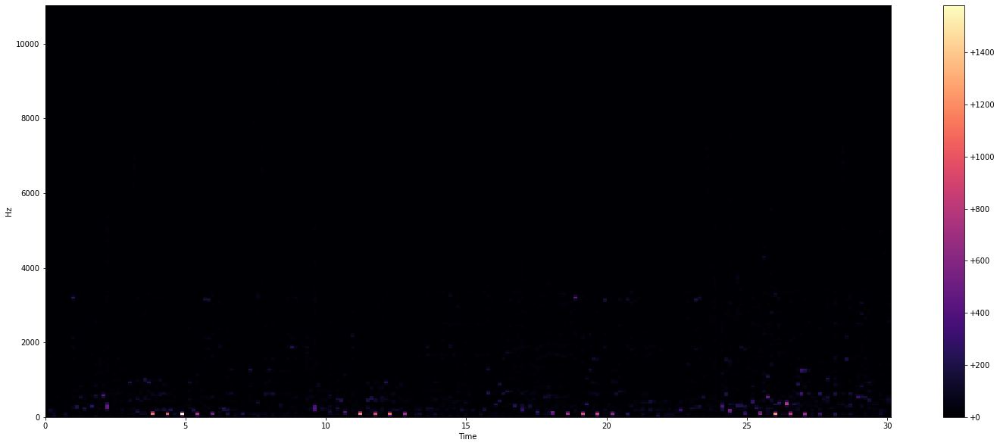

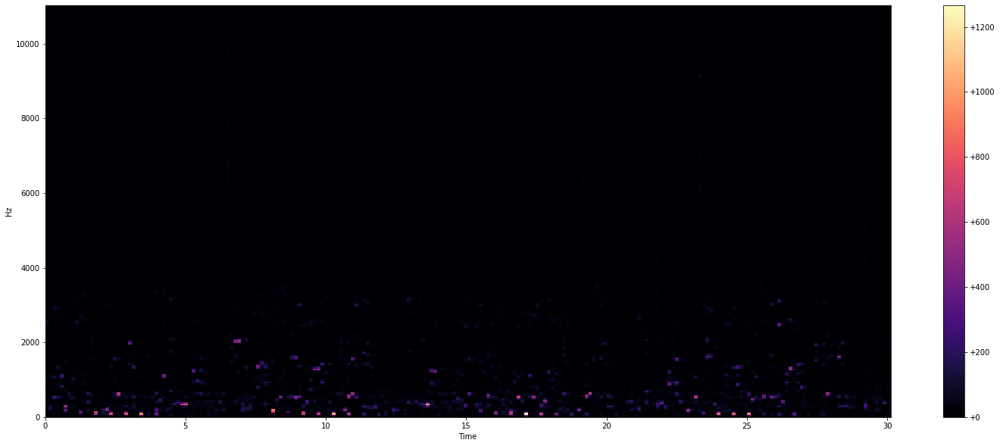

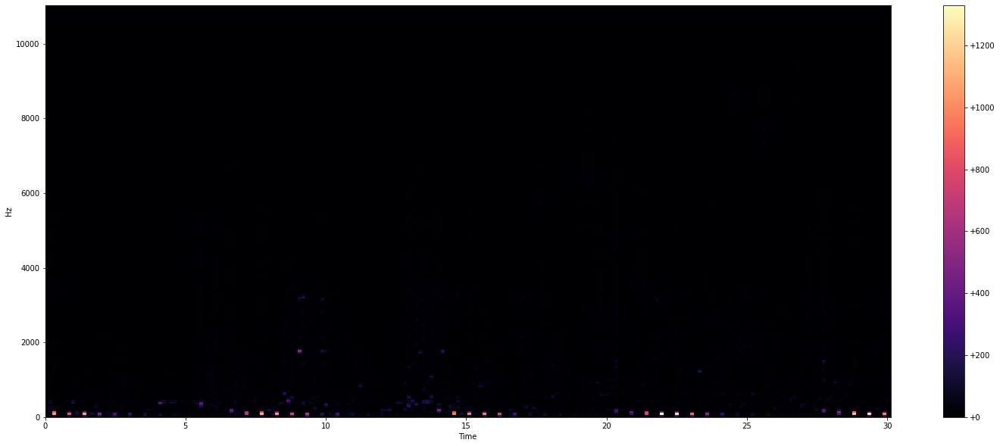

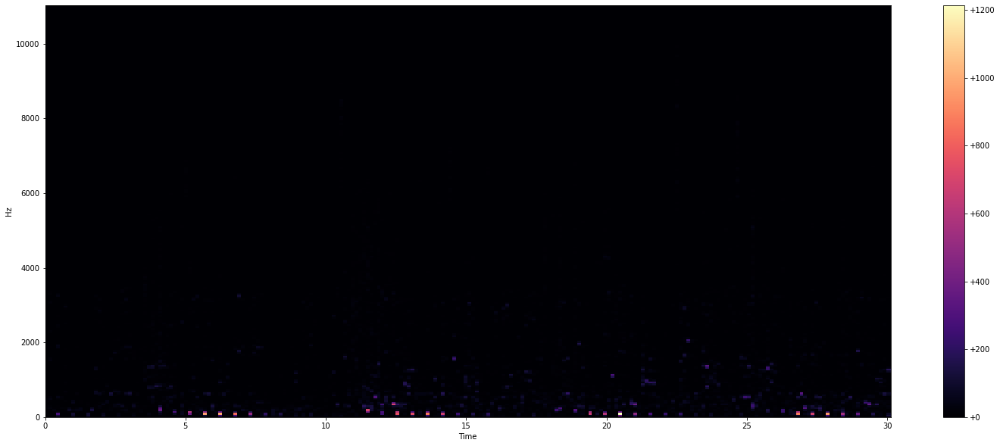

In [ ]:
_ = plot_spectrogram(specs[0][0], 22050, 2965) # 22050 is sampling rate, 2965 is hop_size
_ = plot_spectrogram(specs[0][1], 22050, 2965)
_ = plot_spectrogram(specs[0][2], 22050, 2965)
_ = plot_spectrogram(specs[1][0], 22050, 2965)
_ = plot_spectrogram(specs[1][1], 22050, 2965)
_ = plot_spectrogram(specs[1][2], 22050, 2965)

In [ ]:
# compute and return the log-amplitude spectrograms for the spectrograms created 
# by calculate spectrograms

def log_amplitude_transform(specs):
  log_specs = []
  for i in range(len(specs)):
    channels = []
    for j in range(len(specs[i])):
      log_converted_spec = librosa.power_to_db(specs[i][j])
      channels.append(log_converted_spec)
      # _ = plot_spectrogram(log_converted_spec, 22050, 2965)
    log_specs.append(channels)
  return log_specs

log_specs = log_amplitude_transform(specs)

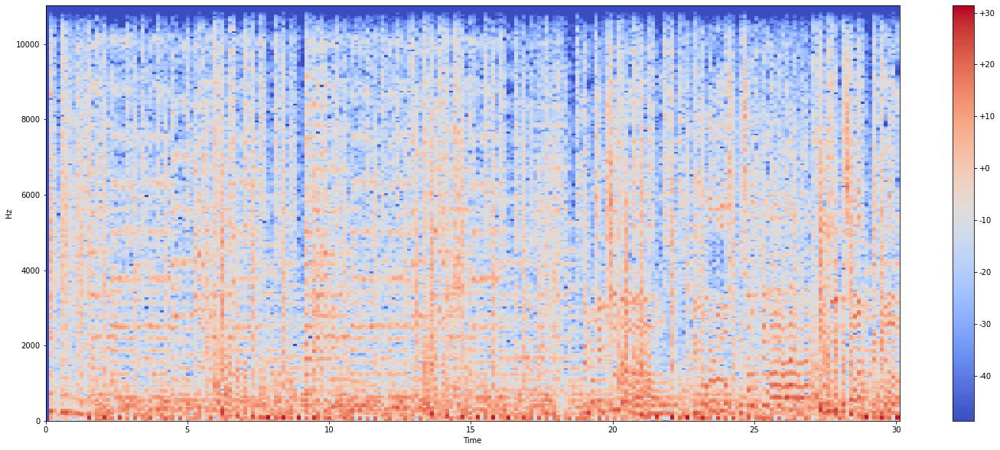

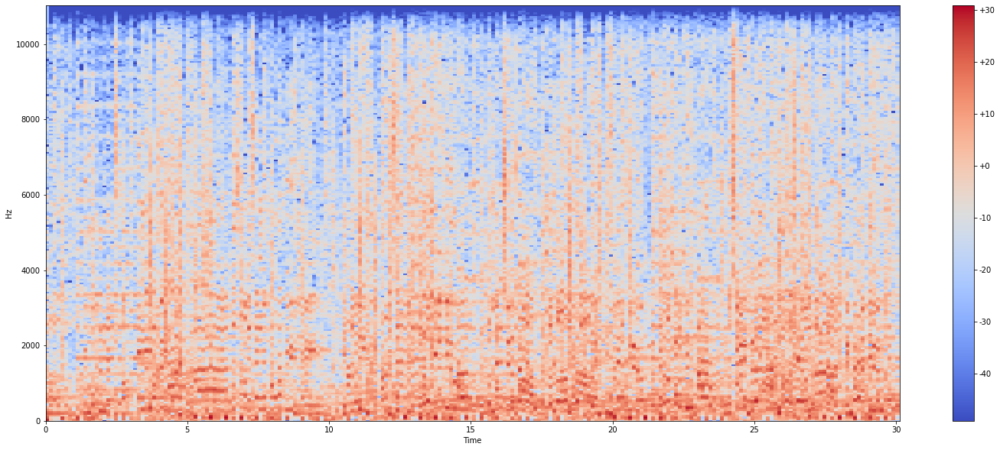

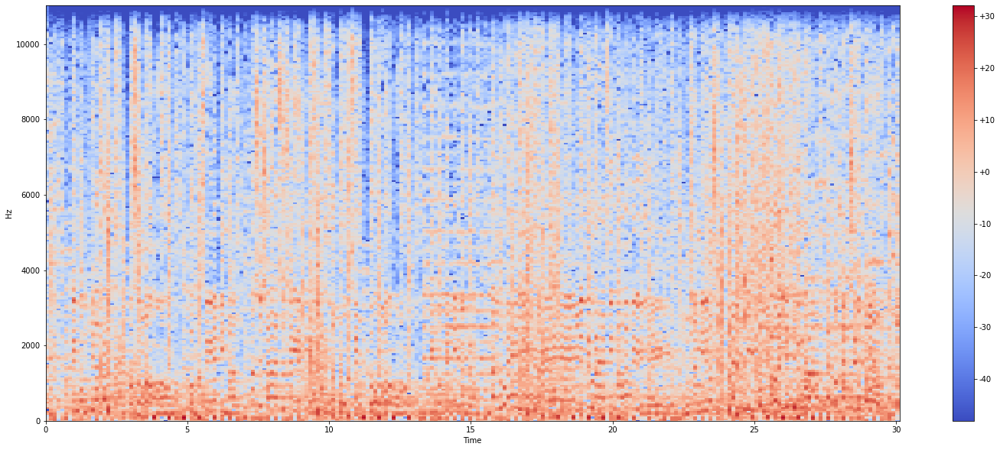

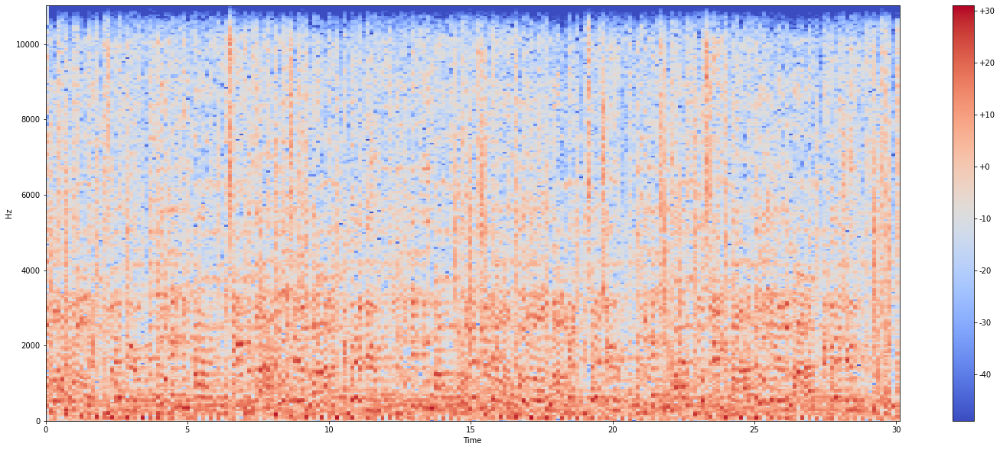

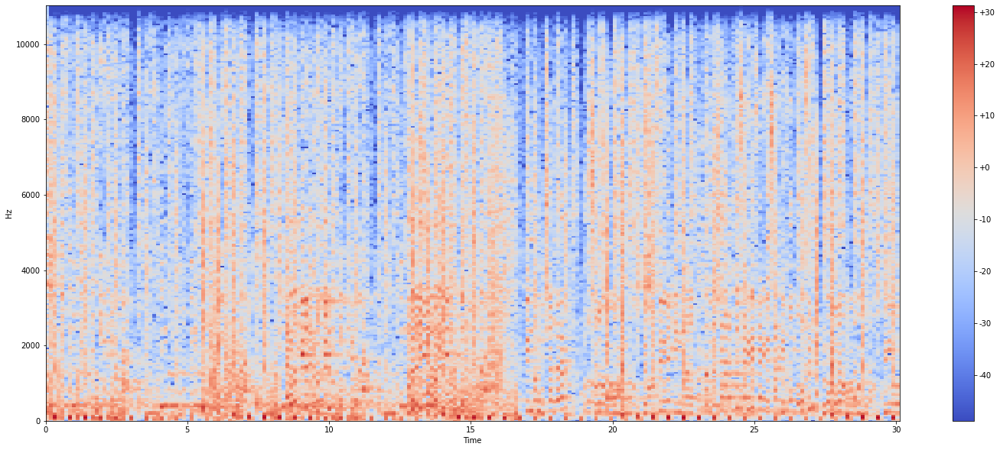

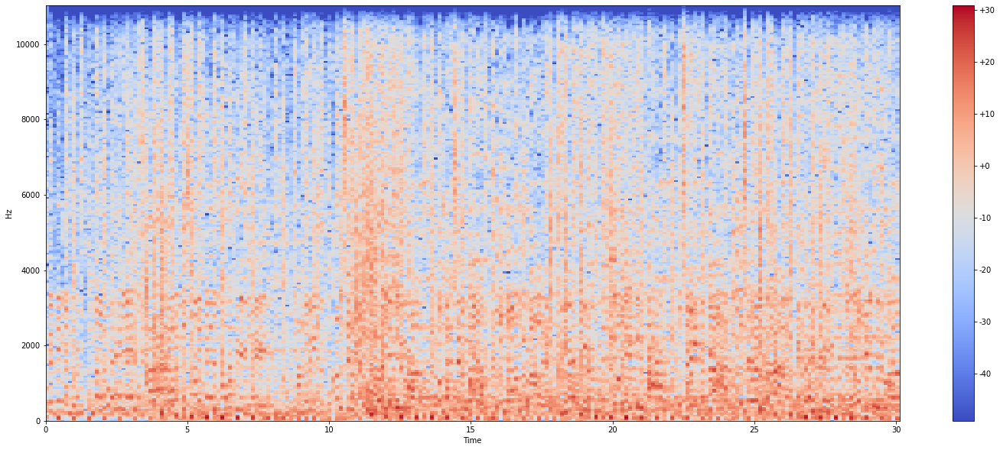

In [ ]:
_ = plot_spectrogram(log_specs[0][0], 22050, 2965) # 22050 is sampling rate, 2965 is hop_size
_ = plot_spectrogram(log_specs[0][1], 22050, 2965)
_ = plot_spectrogram(log_specs[0][2], 22050, 2965)
_ = plot_spectrogram(log_specs[1][0], 22050, 2965)
_ = plot_spectrogram(log_specs[1][1], 22050, 2965)
_ = plot_spectrogram(log_specs[1][2], 22050, 2965)

In [ ]:
# Let the output of log_amplitude_transform() be called log_specs. 
# This function transforms x[i][:] into tensors of size (3 x 224 x 224)
def log_specs_to_image_tensors(log_specs):
  imgs = []
  for i in range(len(log_specs)):
    img = torch.tensor(specs[i])
    # print(img.size())
    imgs.append(img)
  return imgs

imgs = log_specs_to_image_tensors(log_specs)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


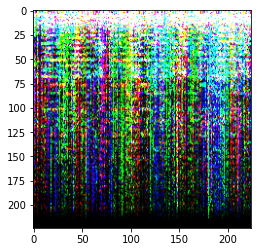

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


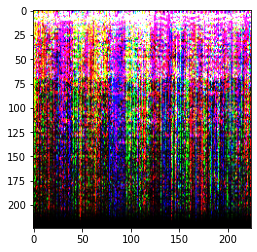

In [ ]:
# visualize
for x in imgs:
  plt.figure()
  plt.imshow(x.permute(1,2,0))
  plt.show()

In [ ]:
# Putting everything together: The Spectrogram Extraction Process

# A funtion that takes in the name of a song file (that is assumed to exist), 
# and returns a list of spectrograms of size (3 x 224 x 224) 
def get_3channel_spectrograms(song_file):
  # get 90-second song clips, in three 30-second chunks each
  file_names = get_song_clips(song_file)
  # load song clips to librosa
  song_clips = librosa_load_song_clips(file_names)
  # calculate stft's of each clip
  stft = get_stft_of_clips(song_clips)
  # calculate spectrograms based on stft's
  specs = calculate_spectrograms(stft)
  # transform spectrograms to log-amplitude
  log_specs = log_amplitude_transform(specs)
  # create 3-channel image tensors from each set of 3 spectrograms in log_specs
  imgs = log_specs_to_image_tensors(log_specs)
  return imgs

# a function to delete all intermediate wav files
def remove_intermediate_wav_files():
  # for item in os.listdir("/"):
  #    if item.endswith(".wav"):
  #        os.remove(item)  
  j = 0
  i = 0
  for j in range(num_spectrograms_possible(song_file)):
    for i in range(3):
      os.remove(f'{j*90 + i*30}to{j*90 + i*30 + 30}-' + song_file)

imgs = get_3channel_spectrograms(song_file)
remove_intermediate_wav_files()
os.remove(song_file)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


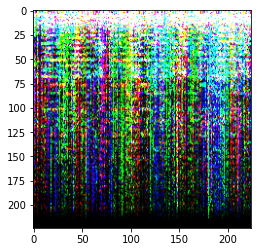

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


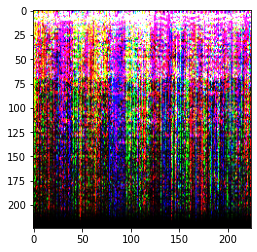

In [ ]:
# visualize
for x in imgs:
  plt.figure()
  plt.imshow(x.permute(1,2,0))
  plt.show()

The function get_3channel_spectrograms(\<song file name\>) will output the spectrograms genereated for an input song. 

# Classifying the Genre of the Input Audio




In [ ]:
# # mount google drive
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
# get the saved parameters of the VGG-19 from Google Drive 
gdd.download_file_from_google_drive(file_id='1zwbum2Bq9VuVnwS0c239bIKqgpEj163r',
                                    dest_path='./cpen291_proj_genreClassifier.zip',
                                    unzip=True)

Unzipping...Done.


In [ ]:
!rm cpen291_proj_genreClassifier.zip

In [ ]:
loaded_model = models.vgg19(pretrained=True)

In [ ]:
# change last layer of the model to have 8 outputs instead of 1000
loaded_model.classifier = nn.Sequential(
    nn.Linear(in_features=25088, out_features=4096, bias=True), 
    nn.ReLU(inplace=True), 
    nn.Dropout(p=0.5, inplace=False), 
    nn.Linear(in_features=4096, out_features=4096, bias=True), 
    nn.ReLU(inplace=True), 
    nn.Dropout(p=0.5, inplace=False), 
    nn.Linear(in_features=4096, out_features=8, bias=True)
)

In [ ]:
# gpu = torch.device('cuda:0')
cpu = torch.device('cpu')

In [ ]:
torch.cuda.is_available()

False

In [ ]:
cpu

device(type='cpu')

In [ ]:
device = cpu

In [ ]:
loaded_model.load_state_dict(torch.load("./cpen291_proj_genreClassifier.pt", map_location=device))
# loaded_model.to(device)
loaded_model.eval()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [ ]:
torch.manual_seed(291)
np.random.seed(291)


results = []
for x in imgs:
  input = x.unsqueeze(dim=0)
  r = loaded_model(input.to(device))
  _, r = torch.max(r.detach(), 1)
  results.append(r.squeeze())

In [ ]:
results

[tensor(1), tensor(0)]

In [ ]:
# get the sum of prediction made by the model (before finding mean)
sum = 0
for i in range (len(results)):
  sum += results[i]

# get the mean of the predictions made by the model
prediction = torch.round(sum / len(results))

In [ ]:
prediction

tensor(0.)

In [ ]:
if prediction == 3:
  genre = "Rock"
if prediction == 2:
  genre = "Rap"
# if final_prediction == 2:
#   genre = "Latin"
if prediction == 0:
  genre = "Electronic"
# if final_prediction == 4:
#   genre = "Folk"
if prediction == 1:
  genre = "Jazz"
# if final_prediction == 6:
#   genre = "Blues"
# if final_prediction == 7:
#   genre = "Country"

In [ ]:
print(genre)

Electronic


# Getting h5 Files

In [ ]:
# Creating separate directories
%mkdir -p data/Jazz
%mkdir -p data/Rock
%mkdir -p data/Rap
%mkdir -p data/Country
%mkdir -p data/Blues
%mkdir -p data/Folk
%mkdir -p data/Latin
%mkdir -p data/Electronic


In [ ]:
# Country
gdd.download_file_from_google_drive(file_id='1ZBz1AVQlno9LzowrDcrkNqnlxoeuu9Hh',
                                    dest_path='./data/Country/Country.zip',
                                    unzip=True)

# Electronic
gdd.download_file_from_google_drive(file_id='1z4lOR8S848C9jX-8_8NAnDXcOL8vanU7',
                                    dest_path='./data/Electronic/Electronic.zip',
                                    unzip=True)
# Rock
gdd.download_file_from_google_drive(file_id='1wzZAtco1Fne1ghId2aqY3JOD17EXX_cw',
                                    dest_path='./data/Rock/Rock.zip',
                                    unzip=True)
# Rap
gdd.download_file_from_google_drive(file_id='1bANWlBT-aS0ofEUhg1YB0NSe-22ljXPZ',
                                    dest_path='./data/Rap/Rap.zip',
                                    unzip=True)

# Latin
gdd.download_file_from_google_drive(file_id='1zUV-jZ8W8z0Pt74OeE8a50X-eguWHB7c',
                                    dest_path='./data/Latin/Latin.zip',
                                    unzip=True)

# Jazz
gdd.download_file_from_google_drive(file_id='1WoYPVm9_hnLkZekEh9JZYJfI6tXWlp9s',
                                    dest_path='./data/Jazz/Jazz.zip',
                                    unzip=True)

# Folk
gdd.download_file_from_google_drive(file_id='1gQeJ0xjALXkMfCTj8IgaczuFhwr1d962',
                                    dest_path='./data/Folk/Folk.zip',
                                    unzip=True)
# Blues
gdd.download_file_from_google_drive(file_id='1gQQf591gQ6bMY_4dyWNrhcinZ1VgLtv3',
                                    dest_path='./data/Blues/Blues.zip',
                                    unzip=True)

Unzipping...Done.
Unzipping...Done.
Unzipping...Done.
Unzipping...Done.
Unzipping...Done.
Unzipping...Done.
Unzipping...Done.
Unzipping...Done.


In [ ]:
# removing the zip files from each genre directory

!rm data/Blues/Blues.zip
!rm data/Country/Country.zip
!rm data/Electronic/Electronic.zip
!rm data/Folk/Folk.zip
!rm data/Jazz/Jazz.zip
!rm data/Latin/Latin.zip
!rm data/Rap/Rap.zip
!rm data/Rock/Rock.zip

# Getting Identifying Information of Another Song in the Same Genre
- generate random number i in range(num_of_files_in_dir- 1)
- Traverse through the appropriate directory for the genres's h5 files for i steps
- return info from h5 file

In [ ]:
directory = "data/" + genre + "/" 
index = random.randint(0, len(os.listdir(directory)))
x = 0
# Iterating through the folder to get the name of the h5 file with our recommendation
h5_id = ""
for file in os.listdir(directory):
  if x > index:
    h5_id = os.fsdecode(file)
    break
  else:
    x += 1  

In [ ]:
h5_id

'TRBEYPA128F933197C.h5'

In [ ]:
directory = directory + h5_id
h5 = tables.open_file(directory, mode='r')

artist_name = hdf5_getters.get_artist_name(h5)
title = hdf5_getters.get_title(h5)

h5.close()

# Display the above information in the GUI

In [ ]:
print(artist_name, title)

b'Richard Galliano' b'Honey Fingers'
